In [ ]:
import json

# eval_results_gt_scanrefer.json 파일 경로
file_path = '../output/eval_results_gt_scanrefer2.json'

# 파일 읽기
with open(file_path, 'r') as f:
    data = json.load(f)

# acc05와 acc025가 True인 항목들 추출
true_acc05_data = [entry for entry in data if entry["acc05"]]
true_acc025_data = [entry for entry in data if entry["acc025"]]

# 비율 계산
total = len(data)
true_acc05_count = len(true_acc05_data)
true_acc025_count = len(true_acc025_data)

true_acc05_ratio = true_acc05_count / total * 100
true_acc025_ratio = true_acc025_count / total * 100

print(f"True acc05 ratio: {true_acc05_ratio}%")
print(f"True acc025 ratio: {true_acc025_ratio}%")

True acc05 ratio: 56.82128957610182%
True acc025 ratio: 60.83938150836226%


In [2]:
#!/usr/bin/env python
# Downloads ScanNet public data release
# Run with ./download-scannet.py (or python download-scannet.py on Windows)
# -*- coding: utf-8 -*-
import argparse
import os
import urllib.request 
import tempfile

import ssl 
ssl._create_default_https_context = ssl._create_unverified_context

BASE_URL = 'http://kaldir.vc.in.tum.de/scannet/'
TOS_URL = BASE_URL + 'ScanNet_TOS.pdf'
FILETYPES = ['.aggregation.json', '.sens', '.txt', '_vh_clean.ply', '_vh_clean_2.0.010000.segs.json', '_vh_clean_2.ply', '_vh_clean.segs.json', '_vh_clean.aggregation.json', '_vh_clean_2.labels.ply', '_2d-instance.zip', '_2d-instance-filt.zip', '_2d-label.zip', '_2d-label-filt.zip']
FILETYPES_TEST = ['.sens', '.txt', '_vh_clean.ply', '_vh_clean_2.ply']
PREPROCESSED_FRAMES_FILE = ['scannet_frames_25k.zip', '5.6GB']
TEST_FRAMES_FILE = ['scannet_frames_test.zip', '610MB']
LABEL_MAP_FILES = ['scannetv2-labels.combined.tsv', 'scannet-labels.combined.tsv']
DATA_EFFICIENT_FILES = ['limited-reconstruction-scenes.zip', 'limited-annotation-points.zip', 'limited-bboxes.zip', '1.7MB']
GRIT_FILES = ['ScanNet-GRIT.zip']
RELEASES = ['v2/scans', 'v1/scans']
RELEASES_TASKS = ['v2/tasks', 'v1/tasks']
RELEASES_NAMES = ['v2', 'v1']
RELEASE = RELEASES[0]
RELEASE_TASKS = RELEASES_TASKS[0]
RELEASE_NAME = RELEASES_NAMES[0]
LABEL_MAP_FILE = LABEL_MAP_FILES[0]
RELEASE_SIZE = '1.2TB'
V1_IDX = 1


def get_release_scans(release_file):
    scan_lines = urllib.request.urlopen(release_file)
    scans = []
    for scan_line in scan_lines:
        scan_id = scan_line.decode('utf8').rstrip('\n')
        scans.append(scan_id)
    return scans


def download_release(release_scans, out_dir, file_types, use_v1_sens, skip_existing):
    if len(release_scans) == 0:
        return
    print('Downloading ScanNet ' + RELEASE_NAME + ' release to ' + out_dir + '...')
    for scan_id in release_scans:
        scan_out_dir = os.path.join(out_dir, scan_id)
        download_scan(scan_id, scan_out_dir, file_types, use_v1_sens, skip_existing)
    print('Downloaded ScanNet ' + RELEASE_NAME + ' release.')


def download_file(url, out_file):
    out_dir = os.path.dirname(out_file)
    if not os.path.isdir(out_dir):
        os.makedirs(out_dir)
    if not os.path.isfile(out_file):
        print('\t' + url + ' > ' + out_file)
        fh, out_file_tmp = tempfile.mkstemp(dir=out_dir)
        f = os.fdopen(fh, 'w')
        f.close()
        urllib.request.urlretrieve(url, out_file_tmp)
        os.rename(out_file_tmp, out_file)
    else:
        print('WARNING: skipping download of existing file ' + out_file)

def download_scan(scan_id, out_dir, file_types, use_v1_sens, skip_existing=False):
    print('Downloading ScanNet ' + RELEASE_NAME + ' scan ' + scan_id + ' ...')
    if not os.path.isdir(out_dir):
        os.makedirs(out_dir)
    for ft in file_types:
        v1_sens = use_v1_sens and ft == '.sens'
        url = BASE_URL + RELEASE + '/' + scan_id + '/' + scan_id + ft if not v1_sens else BASE_URL + RELEASES[V1_IDX] + '/' + scan_id + '/' + scan_id + ft
        out_file = out_dir + '/' + scan_id + ft
        if skip_existing and os.path.isfile(out_file):
            continue
        download_file(url, out_file)
    print('Downloaded scan ' + scan_id)


def download_task_data(out_dir):
    print('Downloading ScanNet v1 task data...')
    files = [
        LABEL_MAP_FILES[V1_IDX], 'obj_classification/data.zip',
        'obj_classification/trained_models.zip', 'voxel_labeling/data.zip',
        'voxel_labeling/trained_models.zip'
    ]
    for file in files:
        url = BASE_URL + RELEASES_TASKS[V1_IDX] + '/' + file
        localpath = os.path.join(out_dir, file)
        localdir = os.path.dirname(localpath)
        if not os.path.isdir(localdir):
          os.makedirs(localdir)
        download_file(url, localpath)
    print('Downloaded task data.')

def download_tfrecords(in_dir, out_dir):
    print('Downloading tf records (302 GB)...')
    if not os.path.exists(out_dir):
        os.makedirs(out_dir)
    split_to_num_shards = {'train': 100, 'val': 25, 'test': 10}

    for folder_name in ['hires_tfrecords', 'lores_tfrecords']:
        folder_dir = '%s/%s' % (in_dir, folder_name)
        save_dir = '%s/%s' % (out_dir, folder_name)
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for split, num_shards in split_to_num_shards.items():
            for i in range(num_shards):
                file_name = '%s-%05d-of-%05d.tfrecords' % (split, i, num_shards)
                url = '%s/%s' % (folder_dir, file_name)
                localpath = '%s/%s/%s' % (out_dir, folder_name, file_name)
                download_file(url, localpath)

def download_label_map(out_dir):
    print('Downloading ScanNet ' + RELEASE_NAME + ' label mapping file...')
    files = [ LABEL_MAP_FILE ]
    for file in files:
        url = BASE_URL + RELEASE_TASKS + '/' + file
        localpath = os.path.join(out_dir, file)
        localdir = os.path.dirname(localpath)
        if not os.path.isdir(localdir):
          os.makedirs(localdir)
        download_file(url, localpath)
    print('Downloaded ScanNet ' + RELEASE_NAME + ' label mapping file.')


def main():
    parser = argparse.ArgumentParser(description='Downloads ScanNet public data release.')
    parser.add_argument('-o', '--out_dir', required=True, help='directory in which to download')
    parser.add_argument('--task_data', action='store_true', help='download task data (v1)')
    parser.add_argument('--label_map', action='store_true', help='download label map file')
    parser.add_argument('--v1', action='store_true', help='download ScanNet v1 instead of v2')
    parser.add_argument('--id', help='specific scan id to download')
    parser.add_argument('--preprocessed_frames', action='store_true', help='download preprocessed subset of ScanNet frames (' + PREPROCESSED_FRAMES_FILE[1] + ')')
    parser.add_argument('--test_frames_2d', action='store_true', help='download 2D test frames (' + TEST_FRAMES_FILE[1] + '; also included with whole dataset download)')
    parser.add_argument('--data_efficient', action='store_true', help='download data efficient task files; also included with whole dataset download)')
    parser.add_argument('--tf_semantic', action='store_true', help='download google tensorflow records for 3D segmentation / detection')
    parser.add_argument('--grit', action='store_true', help='download ScanNet files for General Robust Image Task')
    parser.add_argument('--type', help='specific file type to download (.aggregation.json, .sens, .txt, _vh_clean.ply, _vh_clean_2.0.010000.segs.json, _vh_clean_2.ply, _vh_clean.segs.json, _vh_clean.aggregation.json, _vh_clean_2.labels.ply, _2d-instance.zip, _2d-instance-filt.zip, _2d-label.zip, _2d-label-filt.zip)')
    parser.add_argument('--skip_existing', action='store_true', help='skip download of existing files when downloading full release')
    args = parser.parse_args()

    print('By pressing any key to continue you confirm that you have agreed to the ScanNet terms of use as described at:')
    print(TOS_URL)
    print('***')
    print('Press any key to continue, or CTRL-C to exit.')
    key = 'n'

    if args.v1:
        global RELEASE
        global RELEASE_TASKS
        global RELEASE_NAME
        global LABEL_MAP_FILE
        RELEASE = RELEASES[V1_IDX]
        RELEASE_TASKS = RELEASES_TASKS[V1_IDX]
        RELEASE_NAME = RELEASES_NAMES[V1_IDX]
        LABEL_MAP_FILE = LABEL_MAP_FILES[V1_IDX]
        assert((not args.tf_semantic) and (not args.grit)), "Task files specified invalid for v1"

    release_file = BASE_URL + RELEASE + '.txt'
    release_scans = get_release_scans(release_file)
    file_types = FILETYPES;
    release_test_file = BASE_URL + RELEASE + '_test.txt'
    release_test_scans = [] if args.v1 else get_release_scans(release_test_file)
    file_types_test = FILETYPES_TEST;
    out_dir_scans = os.path.join(args.out_dir, 'scans')
    out_dir_test_scans = os.path.join(args.out_dir, 'scans_test')
    out_dir_tasks = os.path.join(args.out_dir, 'tasks')

    if args.type:  # download file type
        file_type = args.type
        if file_type not in FILETYPES:
            print('ERROR: Invalid file type: ' + file_type)
            return
        file_types = [file_type]
        if file_type in FILETYPES_TEST:
            file_types_test = [file_type]
        else:
            file_types_test = []
    if args.task_data:  # download task data
        download_task_data(out_dir_tasks)
    elif args.label_map:  # download label map file
        download_label_map(args.out_dir)
    elif args.preprocessed_frames:  # download preprocessed scannet_frames_25k.zip file
        if args.v1:
            print('ERROR: Preprocessed frames only available for ScanNet v2')
        print('You are downloading the preprocessed subset of frames ' + PREPROCESSED_FRAMES_FILE[0] + ' which requires ' + PREPROCESSED_FRAMES_FILE[1] + ' of space.')
        download_file(os.path.join(BASE_URL, RELEASE_TASKS, PREPROCESSED_FRAMES_FILE[0]), os.path.join(out_dir_tasks, PREPROCESSED_FRAMES_FILE[0]))
    elif args.test_frames_2d:  # download test scannet_frames_test.zip file
        if args.v1:
            print('ERROR: 2D test frames only available for ScanNet v2')
        print('You are downloading the 2D test set ' + TEST_FRAMES_FILE[0] + ' which requires ' + TEST_FRAMES_FILE[1] + ' of space.')
        download_file(os.path.join(BASE_URL, RELEASE_TASKS, TEST_FRAMES_FILE[0]), os.path.join(out_dir_tasks, TEST_FRAMES_FILE[0]))
    elif args.data_efficient: # download data efficient task files
        print('You are downloading the data efficient task files' + ' which requires ' + DATA_EFFICIENT_FILES[-1] + ' of space.')
        for k in range(len(DATA_EFFICIENT_FILES)-1):
            download_file(os.path.join(BASE_URL, RELEASE_TASKS, DATA_EFFICIENT_FILES[k]), os.path.join(out_dir_tasks, DATA_EFFICIENT_FILES[k]))
    elif args.tf_semantic: # download google tf records
        download_tfrecords(os.path.join(BASE_URL, RELEASE_TASKS, 'tf3d'), os.path.join(out_dir_tasks, 'tf3d'))
    elif args.grit: # download GRIT file
        download_file(os.path.join(BASE_URL, RELEASE_TASKS, GRIT_FILES[0]), os.path.join(out_dir_tasks, GRIT_FILES[0]))
    elif args.id:  # download single scan
        scan_id = args.id
        is_test_scan = scan_id in release_test_scans
        if scan_id not in release_scans and (not is_test_scan or args.v1):
            print('ERROR: Invalid scan id: ' + scan_id)
        else:
            out_dir = os.path.join(out_dir_scans, scan_id) if not is_test_scan else os.path.join(out_dir_test_scans, scan_id)
            scan_file_types = file_types if not is_test_scan else file_types_test
            use_v1_sens = not is_test_scan
            if not is_test_scan and not args.v1 and '.sens' in scan_file_types:
                print('Note: ScanNet v2 uses the same .sens files as ScanNet v1: Press \'n\' to exclude downloading .sens files for each scan')
                key = 'n'
                if key.strip().lower() == 'n':
                    scan_file_types.remove('.sens')
            download_scan(scan_id, out_dir, scan_file_types, use_v1_sens, skip_existing=args.skip_existing)
    else:  # download entire release
        if len(file_types) == len(FILETYPES):
            print('WARNING: You are downloading the entire ScanNet ' + RELEASE_NAME + ' release which requires ' + RELEASE_SIZE + ' of space.')
        else:
            print('WARNING: You are downloading all ScanNet ' + RELEASE_NAME + ' scans of type ' + file_types[0])
        print('Note that existing scan directories will be skipped. Delete partially downloaded directories to re-download.')
        print('***')
        print('Press any key to continue, or CTRL-C to exit.')
        key = 'n'
        if not args.v1 and '.sens' in file_types:
            print('Note: ScanNet v2 uses the same .sens files as ScanNet v1: Press \'n\' to exclude downloading .sens files for each scan')
            key = 'n'
            if key.strip().lower() == 'n':
                file_types.remove('.sens')
        download_release(release_scans, out_dir_scans, file_types, use_v1_sens=True, skip_existing=args.skip_existing)
        if not args.v1:
            download_label_map(args.out_dir)
            download_release(release_test_scans, out_dir_test_scans, file_types_test, use_v1_sens=False, skip_existing=args.skip_existing)
            download_file(os.path.join(BASE_URL, RELEASE_TASKS, TEST_FRAMES_FILE[0]), os.path.join(out_dir_tasks, TEST_FRAMES_FILE[0]))
            for k in range(len(DATA_EFFICIENT_FILES)-1):
                download_file(os.path.join(BASE_URL, RELEASE_TASKS, DATA_EFFICIENT_FILES[k]), os.path.join(out_dir_tasks, DATA_EFFICIENT_FILES[k]))


if __name__ == "__main__": main()

usage: ipykernel_launcher.py [-h] -o OUT_DIR [--task_data] [--label_map]
                             [--v1] [--id ID] [--preprocessed_frames]
                             [--test_frames_2d] [--data_efficient]
                             [--tf_semantic] [--grit] [--type TYPE]
                             [--skip_existing]
ipykernel_launcher.py: error: the following arguments are required: -o/--out_dir


SystemExit: 2

In [8]:
from plyfile import PlyData

def extract_colors_from_ply(file_path):
    try:
        ply_data = PlyData.read(file_path)
    except Exception as e:
        print(f"Error reading PLY file: {e}")
        return []

    vertex_data = ply_data['vertex']
    print(f"Vertex data fields: {vertex_data.data.dtype.names}")

    # Assuming the PLY file contains 'red', 'green', and 'blue' properties
    if 'red' in vertex_data.data.dtype.names and 'green' in vertex_data.data.dtype.names and 'blue' in vertex_data.data.dtype.names:
        colors = []
        for vertex in vertex_data:
            color = (vertex['red'], vertex['green'], vertex['blue'])
            colors.append(color)
        return colors
    else:
        print("The PLY file does not contain color information.")
        return []

def save_colors_to_file(colors, output_file_path):
    try:
        with open(output_file_path, 'w') as file:
            for color in colors:
                file.write(f"{color}\n")
        print(f"Colors saved to {output_file_path}")
    except Exception as e:
        print(f"Error writing to file: {e}")

# Example usage
file_path = '../data/scans/scene0011_00/scene0011_00_vh_clean_2.ply'  # 실제 파일 경로로 변경
output_file_path = 'extracted_colors.txt'  # 출력 파일 경로

colors = extract_colors_from_ply(file_path)
print(f"Extracted colors: {colors}")

save_colors_to_file(colors, output_file_path)

Vertex data fields: ('x', 'y', 'z', 'red', 'green', 'blue', 'alpha')
Extracted colors: [(np.uint8(35), np.uint8(33), np.uint8(38)), (np.uint8(34), np.uint8(32), np.uint8(39)), (np.uint8(40), np.uint8(35), np.uint8(43)), (np.uint8(35), np.uint8(33), np.uint8(38)), (np.uint8(31), np.uint8(30), np.uint8(31)), (np.uint8(46), np.uint8(45), np.uint8(47)), (np.uint8(32), np.uint8(31), np.uint8(33)), (np.uint8(28), np.uint8(26), np.uint8(36)), (np.uint8(37), np.uint8(36), np.uint8(46)), (np.uint8(16), np.uint8(15), np.uint8(17)), (np.uint8(36), np.uint8(34), np.uint8(42)), (np.uint8(24), np.uint8(22), np.uint8(27)), (np.uint8(27), np.uint8(26), np.uint8(31)), (np.uint8(36), np.uint8(33), np.uint8(42)), (np.uint8(42), np.uint8(39), np.uint8(46)), (np.uint8(22), np.uint8(21), np.uint8(26)), (np.uint8(15), np.uint8(15), np.uint8(21)), (np.uint8(16), np.uint8(15), np.uint8(22)), (np.uint8(15), np.uint8(14), np.uint8(19)), (np.uint8(19), np.uint8(17), np.uint8(22)), (np.uint8(40), np.uint8(40), np.

In [10]:
import json

# 두 개의 파일 경로
file_path1 = '../output/eval_results_gt_scanrefer_hd.json'
file_path2 = '../output/eval_results_gt_scanrefer.json'

# 파일 읽기
with open(file_path1, 'r') as f1, open(file_path2, 'r') as f2:
    data1 = json.load(f1)
    data2 = json.load(f2)

# 두 파일에서 공통된 scene_id를 찾고, acc025 값이 False인 항목을 구분
file1_only_wrong = []
file2_only_wrong = []
both_wrong = []
file1_wrong = []
file2_wrong = []

# 파일 1의 scene_id를 기준으로 처리
for entry1 in data1:
    scene_id1 = entry1.get("text")
    
    # 파일 2에서 해당 scene_id를 찾기
    entry2 = next((item for item in data2 if item.get("text") == scene_id1), None)

    if entry2 is not None:  # 두 파일에 모두 있는 scene_id에 대해 처리
        acc025_1 = entry1.get("acc025")
        acc025_2 = entry2.get("acc025")

        if not acc025_1:
            file1_wrong.append(scene_id1)
        if not acc025_2:
            file2_wrong.append(scene_id1)

        # 파일1에서만 틀린 항목
        if not acc025_1 and acc025_2:
            file1_only_wrong.append(entry1)
        
        # 파일2에서만 틀린 항목
        elif acc025_1 and not acc025_2:
            file2_only_wrong.append(entry1)
            file2_only_wrong.append(entry2)
        
        # 두 파일 모두에서 틀린 항목
        elif not acc025_1 and not acc025_2:
            both_wrong.append((entry1, entry2))

# 결과를 JSON 파일로 저장
output_path1 = 'file1_only_wrong.json'
output_path2 = 'file2_only_wrong.json'
output_path3 = 'both_wrong.json'

# 파일1에서만 틀린 항목을 JSON으로 저장
with open(output_path1, 'w') as out1:
    json.dump(file1_only_wrong, out1, indent=4)

# 파일2에서만 틀린 항목을 JSON으로 저장
with open(output_path2, 'w') as out2:
    json.dump(file2_only_wrong, out2, indent=4)

# 두 파일에서 모두 틀린 항목을 JSON으로 저장
with open(output_path3, 'w') as out3:
    both_wrong_data = [{"file1": entry1, "file2": entry2} for entry1, entry2 in both_wrong]
    json.dump(both_wrong_data, out3, indent=4)

# 결과 출력
print(f"Total items in file1: {len(data1)}")
print(f"Total items in file2: {len(data2)}")
print(f"Total wrong in file1: {len(file1_only_wrong)}")
print(f"Total wrong in file2: {len(file2_only_wrong)}")
print(len(both_wrong))

print(f"Saved file1_only_wrong.json, file2_only_wrong.json, both_wrong.json")


Total items in file1: 9506
Total items in file2: 9506
Total wrong in file1: 34
Total wrong in file2: 184
3570
Saved file1_only_wrong.json, file2_only_wrong.json, both_wrong.json


In [16]:
import json

# JSON 파일 열기
with open('a.json', 'r') as f:
    data = json.load(f)

# "text" 기준 1차 정렬, "acc025" 기준 2차 정렬
sorted_data = sorted(data, key=lambda x: (x.get('text', ''), x.get('acc025', False)))

# 정렬된 데이터를 다시 JSON 파일로 저장
with open('a_sorted.json', 'w') as f:
    json.dump(sorted_data, f, indent=4)

print("정렬이 완료되었습니다.")


정렬이 완료되었습니다.


In [ ]:
import json

# file1_only_wrong.json 파일 로드
file1_only_wrong_path = 'file1_only_wrong.json'
with open(file1_only_wrong_path, 'r') as f:
    file1_only_wrong_data = json.load(f)

# "pmin" 키가 없는 항목 개수 계산
missing_pmin_count = sum(1 for entry in file1_only_wrong_data if "predicted_bbox" not in entry)

# 결과 출력
print(len(file1_only_wrong_data))
print(f"Number of items without 'pmin' in file1_only_wrong.json: {missing_pmin_count}")


380
Number of items without 'pmin' in file1_only_wrong.json: 116


In [3]:
from plyfile import PlyData

def print_ply_header(file_path):
    try:    
        ply_data = PlyData.read(file_path)
        print(ply_data)
    except Exception as e:
        print(f"Error reading PLY file: {e}")

# Example usage
file_path = '../data/scans/scene0011_00/scene0011_00_vh_clean_2.ply'  # 실제 파일 경로로 변경
print_ply_header(file_path)

ply
format binary_little_endian 1.0
comment MLIB generated
element vertex 237360
property float x
property float y
property float z
property uchar red
property uchar green
property uchar blue
property uchar alpha
element face 451905
property list uchar int vertex_indices
end_header


In [9]:
import re

# test.txt 파일 경로
file_path = "test.txt"

# 파일을 읽고 내용 처리
try:
    with open(file_path, 'r', encoding='utf-8') as file:
        # 파일 내용을 읽고 빈 줄을 제거하여 처리
        content = file.read()

    # 빈 줄을 제외한 색상 이름 추출
    # 정규식으로 색상 이름만 추출 (알파벳으로 이루어진 단어만 추출)
    color_names = re.findall(r'\b(?![A-Z]+\b)[a-zA-Z]+\b', content)

    # 색상 이름을 쉼표로 구분된 문자열로 출력
    color_names_str = ', '.join(color_names)

    print("Color names:")
    print(color_names_str)
    
except Exception as e:
    print(f"Error reading the file: {e}")

Color names:
aliceblue, antiquewhite, aqua, aquamarine, azure, beige, bisque, black, blanchedalmond, blue, blueviolet, brown, burlywood, cadetblue, chartreuse, chocolate, coral, cornflowerblue, cornsilk, crimson, cyan, darkblue, darkcyan, darkgoldenrod, darkgray, darkgreen, darkkhaki, darkmagenta, darkolivegreen, darkorange, darkorchid, darkred, darksalmon, darkseagreen, darkslateblue, darkslategray, darkturquoise, darkviolet, deeppink, deepskyblue, dimgray, dodgerblue, firebrick, floralwhite, forestgreen, fuchsia, gainsboro, ghostwhite, gold, goldenrod, gray, green, greenyellow, honeydew, hotpink, indianred, indigo, khaki, lavender, lavenderblush, lawngreen, lemonchiffon, lightblue, lightcoral, lightcyan, lightgoldenrod, yellow, lightgreen, lightgrey, lightpink, lightsalmon, lightseagreen, lightskyblue, lightslategray, lightsteelblue, lightyellow, lime, limegreen, linen, magenta, maroon, mediumaquamarine, mediumblue, mediumorchid, mediumpurple, mediumseagreen, mediumslateblue, mediums

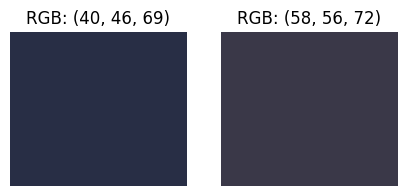

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from colorsys import hsv_to_rgb

# HSV 값 정의
hsv_colors = [
    (0.6264367816091955, 0.42028985507246375, 0.27058823529411763),
    (0.6875, 0.2222222222222222, 0.2823529411764706)
]

# HSV -> RGB 변환 (0-1 범위를 0-255로 변환)
rgb_colors = [tuple(int(c * 255) for c in hsv_to_rgb(*hsv)) for hsv in hsv_colors]

# 색상 시각화
fig, ax = plt.subplots(1, len(rgb_colors), figsize=(5, 2))

for i, rgb in enumerate(rgb_colors):
    ax[i].imshow([[rgb]], aspect="auto")
    ax[i].axis("off")
    ax[i].set_title(f"RGB: {rgb}")

plt.show()